In [183]:
import os, glob
import sys
import pydicom
import random
import re
import scipy
import scipy.misc
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
import numpy as np
import tensorflow as tf 
from keras import backend as K
plt.set_cmap('gray')
%matplotlib inline
seed = 42
random.seed = seed
np.random.seed = seed
tf.seed = seed


IMG_DTYPE = float
SEG_DTYPE = np.uint8

import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model 
# from tensorflow.keras.backend import add 
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda, Activation, Reshape
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.metrics import Recall, Precision

print(tf.__version__)

2.14.0


<Figure size 640x480 with 0 Axes>

In [65]:
def imshow(*args, **kwargs):
    """
    Display one or more images.
    
    Parameters:
    - *args : array-like images to display.
    - cmap : str or list, optional. Colormap (or list of colormaps) for the images. Default is 'gray'.
    - title : str or list, optional. Title (or list of titles) for the subplot(s). Default is an empty string.
    """
    
    cmap = kwargs.get('cmap', 'gray')
    title = kwargs.get('title', '')
    
    # Check if any images are provided
    if len(args) == 0:
        raise ValueError("No images given to imshow")
    elif len(args) == 1:
        plt.title(title)
        plt.imshow(args[0], cmap=cmap, interpolation='none')
    else:
        n = len(args)
        
        # Convert cmap and title to lists if they are strings
        cmap = [cmap] * n if isinstance(cmap, str) else cmap
        title = [title] * n if isinstance(title, str) else title
        
        plt.figure(figsize=(n * 5, 10))
        for i in range(n):
            plt.subplot(1, n, i + 1)
            plt.title(title[i])
            plt.imshow(args[i], cmap=cmap[i], interpolation='none')
    
    plt.show()

def normalize_image(img):
    """Normalize image values to [0,1]."""
    min_, max_ = float(np.min(img)), float(np.max(img))
    return (img - min_) / (max_ - min_)


The preprocessing steps are:
    1. Set pixels with a Hounsfield value greater than 1200 to zero.
    2. Clip all Hounsfield values to the range [-100, 400].
    3. Normalize the image pixel values to [0, 1].
    4. Convert the normalized values to the range [0, 255].
    5. Apply histogram equalization.
    6. Re-normalize the image pixel values to [0, 1].

In [66]:
def step1_preprocess_img_slice(img_slc):
    
    # Set pixels with Hounsfield values greater than 1200 to zero
    slice_data[slice_data > 1000] = 0
    
    # Clip Hounsfield values to the range [-100, 400]
    slice_data = np.clip(slice_data, -100, 400)
    
    # Normalize image pixel values to [0, 1]
    slice_data = normalize_image_values(slice_data)
    
    # Convert normalized values to range [0, 255]
    slice_data_uint8 = (slice_data * 255).astype('uint8')
    
    # Apply histogram equalization
    equalized_slice_data = cv2.equalizeHist(slice_data_uint8)
    
    # Normalize the pixel values of equalized data
    normalized_equalized_slice = normalize_image_values(equalized_slice_data)
    
    return normalized_equalized_slice


In [184]:
class DICOMDataGenerator(keras.utils.Sequence):
    def __init__(self, image_ids, base_path, batch_size=8, target_image_size=128):
        """
        Initialization method for the data generator.
        
        Parameters:
        - image_ids: List of IDs corresponding to the DICOM images.
        - base_path: Base directory where the DICOM images and masks are stored.
        - batch_size: Number of images per batch.
        - target_image_size: Size to which the images should be resized.
        """
        self.image_ids = image_ids
        self.base_path = base_path
        self.batch_size = batch_size
        self.target_image_size = target_image_size
        self.on_epoch_end()

    def __load_image_and_mask__(self, id_name):
        """
        Loads a DICOM image and its associated mask given an ID.
        
        Parameters:
        - id_name: ID of the DICOM image to load.
        
        Returns:
        - Processed DICOM image and its associated mask.
        """
        patient_id = id_name.split('_')
        dicom_image_path = os.path.join(self.base_path, "patients", id_name)
        mask_directory = os.path.join(self.base_path, "masks")
        
        dicom_image = pydicom.dcmread(dicom_image_path)
        processed_image = step1_preprocess_img_slice(dicom_image.pixel_array)
        resized_image = np.array(Image.fromarray(processed_image).resize([self.target_image_size, self.target_image_size])).astype(IMG_DTYPE)
        
        mask_image = pydicom.dcmread(os.path.join(mask_directory, patient_id[0]+'_liver', id_name)).pixel_array
        processed_mask = mask_image/255.0
        resized_mask = np.array(Image.fromarray(processed_mask).resize([self.target_image_size, self.target_image_size])).astype(IMG_DTYPE)
        mask_channel_added = resized_mask[:, :, np.newaxis]
        
        return resized_image, mask_channel_added

    def __getitem__(self, index):
        """
        Generates a batch of images and masks at the given index.
        
        Parameters:
        - index: Batch index.
        
        Returns:
        - Batch of images and masks.
        """
        # Handle the edge case where the requested batch size is larger than the remaining images.
        if (index+1) * self.batch_size > len(self.image_ids):
            self.batch_size = len(self.image_ids) - index * self.batch_size

        batch_ids = self.image_ids[index * self.batch_size: (index+1) * self.batch_size]

        batch_images = []
        batch_masks = []

        for id_name in batch_ids:
            image, mask = self.__load_image_and_mask__(id_name)
            image_rgb = np.stack((image,)*3, axis=-1)  # Convert single channel image to RGB
            batch_images.append(image_rgb)
            batch_masks.append(mask)

        return np.array(batch_images), np.array(batch_masks)

    def __len__(self):
        """
        Returns the total number of batches.
        """
        return int(np.ceil(len(self.image_ids) / float(self.batch_size)))


In [185]:
image_size = 256
train_path = "train"
batch_size = 8
epochs = 50

## Training Ids
images = []
for file in os.listdir(os.path.join(train_path, "patients")):
#     print(file)
    images.append(file)
print(len(images))

val_data_size = len(images)//5

valid_ids = images[:val_data_size]
train_ids = images[val_data_size:]



# Configuration Parameters
image_size = 256
train_directory = "train"
batch_size = 8
epochs = 50

# Fetching all the image IDs from the "patients" directory
image_filenames = [filename for filename in os.listdir(os.path.join(train_directory, "patients"))]
print(f"Total number of images: {len(image_filenames)}")

# Splitting the data into training and validation sets
validation_data_size = len(image_filenames) // 5

validation_image_ids = image_filenames[:validation_data_size]
training_image_ids = image_filenames[validation_data_size:]


23271


In [186]:
gen = DICOMDataGenerator(train_ids, train_path, batch_size=batch_size, image_size=image_size)
x, y = gen.__getitem__(0)

0


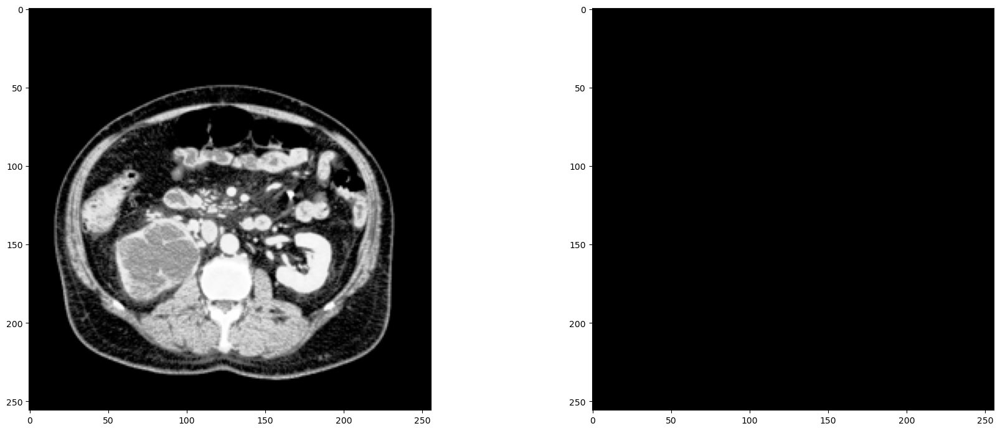

In [187]:
# Select a random image and its corresponding mask
random_index = random.randint(0, len(x) - 1)

# Plotting the image and mask side by side
plt.figure(figsize=(20, 20))

# Display the randomly selected image
plt.subplot(1, 2, 1)
plt.imshow(x[random_index])
plt.title(f"Image Index: {random_index}")

# Display the corresponding mask
plt.subplot(1, 2, 2)
plt.imshow(np.reshape(y[random_index], (image_size, image_size)), cmap="gray")
plt.title("Corresponding Mask")

plt.tight_layout()
plt.show()


In [188]:
def bn_act(x, act=True):
    x = keras.layers.BatchNormalization()(x)
    if act == True:
        x = keras.layers.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    
    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)
    
    output = keras.layers.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)
    
    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)
    
    output = keras.layers.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = keras.layers.UpSampling2D((2, 2))(x)
    c = keras.layers.Concatenate()([u, xskip])
    return c


def apply_batchnorm_and_activation(x, activate=True):
    """
    Apply Batch Normalization and optionally an Activation function on input tensor.
    """
    x = keras.layers.BatchNormalization()(x)
    if activate:
        x = keras.layers.Activation("relu")(x)
    return x

def convolutional_block(x, num_filters, filter_size=(3, 3), padding="same", stride=1):
    """
    Apply Batch Normalization, Activation and Convolution on the input tensor.
    """
    x = apply_batchnorm_and_activation(x)
    x = keras.layers.Conv2D(num_filters, filter_size, padding=padding, strides=stride)(x)
    return x

def initial_stem_block(x, num_filters, filter_size=(3, 3), padding="same", stride=1):
    """
    Initial block for ResNet with a convolutional layer followed by a skip connection.
    """
    x_conv = keras.layers.Conv2D(num_filters, filter_size, padding=padding, strides=stride)(x)
    x_conv = convolutional_block(x_conv, num_filters, filter_size=filter_size, padding=padding, stride=stride)
    
    x_shortcut = keras.layers.Conv2D(num_filters, kernel_size=(1, 1), padding=padding, strides=stride)(x)
    x_shortcut = apply_batchnorm_and_activation(x_shortcut, activate=False)
    
    output_tensor = keras.layers.Add()([x_conv, x_shortcut])
    return output_tensor

def resnet_block(x, num_filters, filter_size=(3, 3), padding="same", stride=1):
    """
    A standard ResNet block with two convolutional layers and a skip connection.
    """
    x_res = convolutional_block(x, num_filters, filter_size=filter_size, padding=padding, stride=stride)
    x_res = convolutional_block(x_res, num_filters, filter_size=filter_size, padding=padding, stride=1)
    
    x_shortcut = keras.layers.Conv2D(num_filters, kernel_size=(1, 1), padding=padding, strides=stride)(x)
    x_shortcut = apply_batchnorm_and_activation(x_shortcut, activate=False)
    
    output_tensor = keras.layers.Add()([x_shortcut, x_res])
    return output_tensor

def upsample_and_concatenate(x, skip_tensor):
    """
    Upsample the input tensor and concatenate it with a skip tensor.
    """
    x_upsampled = keras.layers.UpSampling2D((2, 2))(x)
    concatenated_tensor = keras.layers.Concatenate()([x_upsampled, skip_tensor])
    return concatenated_tensor


In [189]:
def ResUNet():
    # Filter sizes
    f = [16, 32, 64, 128, 256]
    
    # Input layer
    inputs = keras.layers.Input((image_size, image_size, 3))
    
    ## Encoder
    e0 = inputs
    e1 = initial_stem_block(e0, f[0])
    e2 = resnet_block(e1, f[1], stride=2)
    e3 = resnet_block(e2, f[2], stride=2)
    e4 = resnet_block(e3, f[3], stride=2)
    e5 = resnet_block(e4, f[4], stride=2)
    
    ## Bridge
    b0 = convolutional_block(e5, f[4], stride=1)
    b1 = convolutional_block(b0, f[4], stride=1)
    
    ## Decoder
    u1 = upsample_and_concatenate(b1, e4)
    d1 = resnet_block(u1, f[4])
    
    u2 = upsample_and_concatenate(d1, e3)
    d2 = resnet_block(u2, f[3])
    
    u3 = upsample_and_concatenate(d2, e2)
    d3 = resnet_block(u3, f[2])
    
    u4 = upsample_and_concatenate(d3, e1)
    d4 = resnet_block(u4, f[1])
    
    # Output layer
    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    
    # Create and return the model
    model = keras.models.Model(inputs, outputs)
    return model


In [191]:
smooth = 1e-15

def dice_coef(y_true, y_pred):
    y_true_f = keras.layers.Flatten()(y_true)
    y_pred_f = y_true_f = keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou(y_true,y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)


def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [192]:
model = ResUNet()
adam = tf.keras.optimizers.legacy.Adam(learning_rate = 1e-4)
model.compile(optimizer=adam, loss='binary_crossentropy', metrics=["acc", dice_coef,iou, Recall(),Precision()])
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_29 (InputLayer)       [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_469 (Conv2D)         (None, 256, 256, 16)         448       ['input_29[0][0]']            
                                                                                                  
 batch_normalization_168 (B  (None, 256, 256, 16)         64        ['conv2d_469[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_297 (Activation  (None, 256, 256, 16)         0         ['batch_normalization_16

 atchNormalization)                                                                               
                                                                                                  
 conv2d_480 (Conv2D)         (None, 32, 32, 128)          8320      ['add_76[0][0]']              
                                                                                                  
 activation_303 (Activation  (None, 32, 32, 128)          0         ['batch_normalization_177[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_178 (B  (None, 32, 32, 128)          512       ['conv2d_480[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 conv2d_47

                                                                                                  
 add_79 (Add)                (None, 32, 32, 256)          0         ['batch_normalization_186[0][0
                                                                    ]',                           
                                                                     'conv2d_487[0][0]']          
                                                                                                  
 up_sampling2d_45 (UpSampli  (None, 64, 64, 256)          0         ['add_79[0][0]']              
 ng2D)                                                                                            
                                                                                                  
 concatenate_66 (Concatenat  (None, 64, 64, 320)          0         ['up_sampling2d_45[0][0]',    
 e)                                                                  'add_76[0][0]']              
          

                                                                                                  
 conv2d_497 (Conv2D)         (None, 256, 256, 32)         2592      ['concatenate_68[0][0]']      
                                                                                                  
 activation_315 (Activation  (None, 256, 256, 32)         0         ['batch_normalization_194[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_195 (B  (None, 256, 256, 32)         128       ['conv2d_497[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 conv2d_496 (Conv2D)         (None, 256, 256, 32)         9248      ['activation_315[0][0]']      
          

In [193]:
train_gen = DICOMDataGenerator(train_ids, train_path, image_size=image_size, batch_size=batch_size)
valid_gen = DICOMDataGenerator(valid_ids, train_path, image_size=image_size, batch_size=batch_size)

train_steps = len(train_ids)//batch_size
valid_steps = len(valid_ids)//batch_size

logger_path = os.path.join("Liver-segmentation.csv")
path_ = "Dataset"

callbacks = [
    ModelCheckpoint(path_, verbose=1, save_best_only=True, monitor='val_loss'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1,patience=10, min_lr=1e-7,verbose=1),
    CSVLogger(logger_path),
    TensorBoard(),
    EarlyStopping(monitor='val_loss',patience=50,restore_best_weights=False)
]

model_history = model.fit(train_gen, validation_data=valid_gen, steps_per_epoch=train_steps, validation_steps=valid_steps, 
                    epochs=epochs,shuffle=True, callbacks=callbacks)

Epoch 1/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0427 - acc: 0.9544 - dice_coef: 0.7968 - iou: 0.6902 - recall: 0.7308 - precision: 0.9421
Epoch 1: val_loss improved from inf to 0.18346, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 3923s 2s/step - loss: 0.0427 - acc: 0.9544 - dice_coef: 0.7968 - iou: 0.6902 - recall: 0.7308 - precision: 0.9421 - val_loss: 0.1835 - val_acc: 0.9238 - val_dice_coef: 0.5308 - val_iou: 0.3100 - val_recall: 0.2639 - val_precision: 0.9940 - lr: 1.0000e-04
Epoch 2/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0254 - acc: 0.9572 - dice_coef: 0.7119 - iou: 0.6169 - recall: 0.7491 - precision: 0.9775
Epoch 2: val_loss improved from 0.18346 to 0.02805, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 879s 378ms/step - loss: 0.0254 - acc: 0.9572 - dice_coef: 0.7119 - iou: 0.6169 - recall: 0.7491 - precision: 0.9775 - val_loss: 0.0280 - val_acc: 0.9582 - val_dice_coef: 0.9052 - val_iou: 0.8128 - val_recall: 0.7400 - val_precision: 0.9812 - lr: 1.0000e-04
Epoch 3/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0195 - acc: 0.9591 - dice_coef: 0.7234 - iou: 0.6467 - recall: 0.7541 - precision: 0.9854
Epoch 3: val_loss did not improve from 0.02805
2327/2327 [==============================] - 864s 371ms/step - loss: 0.0195 - acc: 0.9591 - dice_coef: 0.7234 - iou: 0.6467 - recall: 0.7541 - precision: 0.9854 - val_loss: 0.0360 - val_acc: 0.9561 - val_dice_coef: 0.8851 - val_iou: 0.7725 - val_recall: 0.6828 - val_precision: 0.9939 - lr: 1.0000e-04
Epoch 4/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0166 - acc: 0.9601 - dice_coef: 0.7308 - iou: 0.6615 - recall: 0.7559 - precision: 0.9887
Epoch 4: val_loss did

INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 882s 379ms/step - loss: 0.0124 - acc: 0.9603 - dice_coef: 0.7260 - iou: 0.6721 - recall: 0.7533 - precision: 0.9933 - val_loss: 0.0271 - val_acc: 0.9582 - val_dice_coef: 0.9400 - val_iou: 0.8499 - val_recall: 0.7515 - val_precision: 0.9790 - lr: 1.0000e-04
Epoch 8/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0102 - acc: 0.9615 - dice_coef: 0.7413 - iou: 0.6982 - recall: 0.7617 - precision: 0.9954
Epoch 8: val_loss did not improve from 0.02714
2327/2327 [==============================] - 866s 372ms/step - loss: 0.0102 - acc: 0.9615 - dice_coef: 0.7413 - iou: 0.6982 - recall: 0.7617 - precision: 0.9954 - val_loss: 0.0392 - val_acc: 0.9551 - val_dice_coef: 0.9182 - val_iou: 0.7930 - val_recall: 0.7145 - val_precision: 0.9733 - lr: 1.0000e-04
Epoch 9/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0109 - acc: 0.9604 - dice_coef: 0.7338 - iou: 0.6873 - recall: 0.7567 - precision: 0.9946
Epoch 9: val_loss did

INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 865s 372ms/step - loss: 0.0086 - acc: 0.9612 - dice_coef: 0.7478 - iou: 0.7103 - recall: 0.7604 - precision: 0.9976 - val_loss: 0.0254 - val_acc: 0.9585 - val_dice_coef: 0.9428 - val_iou: 0.8573 - val_recall: 0.7596 - val_precision: 0.9800 - lr: 1.0000e-04
Epoch 11/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0102 - acc: 0.9610 - dice_coef: 0.7375 - iou: 0.6961 - recall: 0.7603 - precision: 0.9959
Epoch 11: val_loss did not improve from 0.02542
2327/2327 [==============================] - 859s 369ms/step - loss: 0.0102 - acc: 0.9610 - dice_coef: 0.7375 - iou: 0.6961 - recall: 0.7603 - precision: 0.9959 - val_loss: 0.0310 - val_acc: 0.9577 - val_dice_coef: 0.9344 - val_iou: 0.8360 - val_recall: 0.7301 - val_precision: 0.9841 - lr: 1.0000e-04
Epoch 12/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0087 - acc: 0.9619 - dice_coef: 0.7424 - iou: 0.7061 - recall: 0.7654 - precision: 0.9971
Epoch 12: val_loss

INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 3379s 1s/step - loss: 0.0072 - acc: 0.9618 - dice_coef: 0.7490 - iou: 0.7195 - recall: 0.7601 - precision: 0.9985 - val_loss: 0.0233 - val_acc: 0.9596 - val_dice_coef: 0.9537 - val_iou: 0.8778 - val_recall: 0.7478 - val_precision: 0.9887 - lr: 1.0000e-04
Epoch 15/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0081 - acc: 0.9621 - dice_coef: 0.7338 - iou: 0.6963 - recall: 0.7557 - precision: 0.9972
Epoch 15: val_loss did not improve from 0.02332
2327/2327 [==============================] - 2935s 1s/step - loss: 0.0081 - acc: 0.9621 - dice_coef: 0.7338 - iou: 0.6963 - recall: 0.7557 - precision: 0.9972 - val_loss: 0.0242 - val_acc: 0.9595 - val_dice_coef: 0.9378 - val_iou: 0.8588 - val_recall: 0.7537 - val_precision: 0.9891 - lr: 1.0000e-04
Epoch 16/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0072 - acc: 0.9614 - dice_coef: 0.7629 - iou: 0.7336 - recall: 0.7670 - precision: 0.9986
Epoch 16: val_loss did

INFO:tensorflow:Assets written to: Dataset/assets


2327/2327 [==============================] - 3280s 1s/step - loss: 0.0069 - acc: 0.9617 - dice_coef: 0.7410 - iou: 0.7132 - recall: 0.7659 - precision: 0.9987 - val_loss: 0.0219 - val_acc: 0.9601 - val_dice_coef: 0.9564 - val_iou: 0.8873 - val_recall: 0.7538 - val_precision: 0.9928 - lr: 1.0000e-04
Epoch 19/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0075 - acc: 0.9615 - dice_coef: 0.7468 - iou: 0.7159 - recall: 0.7600 - precision: 0.9982
Epoch 19: val_loss did not improve from 0.02188
2327/2327 [==============================] - 2122s 912ms/step - loss: 0.0075 - acc: 0.9615 - dice_coef: 0.7468 - iou: 0.7159 - recall: 0.7600 - precision: 0.9982 - val_loss: 0.0224 - val_acc: 0.9598 - val_dice_coef: 0.9525 - val_iou: 0.8801 - val_recall: 0.7621 - val_precision: 0.9843 - lr: 1.0000e-04
Epoch 20/50
2327/2327 [==============================] - ETA: 0s - loss: 0.0077 - acc: 0.9612 - dice_coef: 0.7514 - iou: 0.7181 - recall: 0.7587 - precision: 0.9974
Epoch 20: val_loss 

Epoch 50/50
2327/2327 [==============================] - ETA: 0s - loss: -0.0105 - acc: 0.9616 - dice_coef: 0.7734 - iou: 0.7512 - recall: 0.7710 - precision: 0.9999
Epoch 50: val_loss did not improve from 0.02188
2327/2327 [==============================] - 2548s 1s/step - loss: -0.0105 - acc: 0.9616 - dice_coef: 0.7734 - iou: 0.7512 - recall: 0.7710 - precision: 0.9999 - val_loss: 0.0419 - val_acc: 0.9602 - val_dice_coef: 0.9677 - val_iou: 0.8956 - val_recall: 0.7580 - val_precision: 0.9932 - lr: 1.0000e-07


In [214]:
model.save('liver_model_resunet.keras')  # creates a HDF5 file 'my_model.h5'
model.save_weights("liver_model_weights_resunet.keras")

In [215]:
# del model
model.save(os.path.join('models','liver_model_final_resunet.keras'))  # creates a HDF5 file 'my_model.h5'

model = keras.models.load_model(os.path.join('models','liver_model_final_resunet.keras'), compile= False)
# model.summary()
valid_gen = DataGen(valid_ids, train_path, image_size=image_size, batch_size=batch_size)

1/1 [==============================] - 1s 996ms/step


(8, 256, 256, 3) (8, 256, 256, 1)


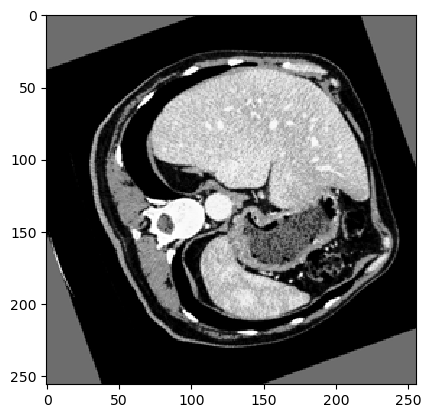

In [221]:
x, y = valid_gen.__getitem__(21)
result = model.predict(x)

result = result > 0.5
print(x.shape, result.shape)

imshow(x[1])

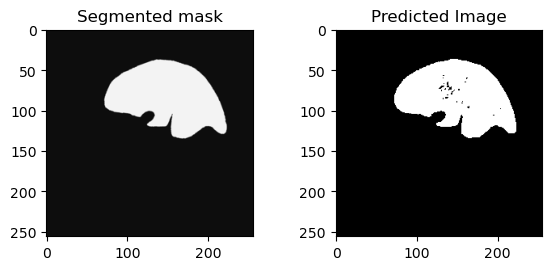

In [223]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Add the first subplot with a label
ax = fig.add_subplot(1, 2, 1)
ax.imshow(np.reshape(y[1] * 255, (image_size, image_size)), cmap="gray")
ax.set_title("Segmented mask")  # Add a title to the first subplot

# Add the second subplot with a label
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.reshape(result[1] * 255, (image_size, image_size)), cmap="gray")
ax.set_title("Predicted Image")  # Add a title to the second subplot

# Show the figure with subplots
plt.show()

1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 1s 935ms/step


/var/folders/w7/y5klds4x3_53168tgqlttv6w0000gn/T/ipykernel_30268/2799955440.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(20,20))


1/1 [==============================] - 1s 926ms/step


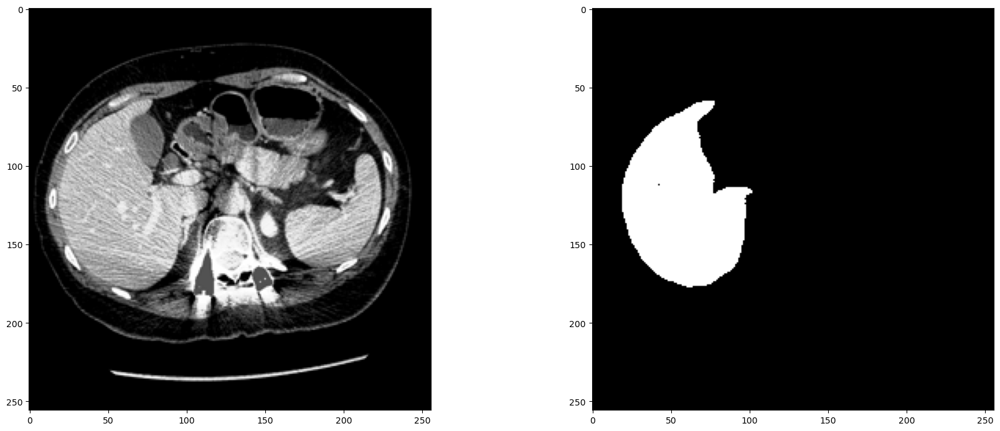

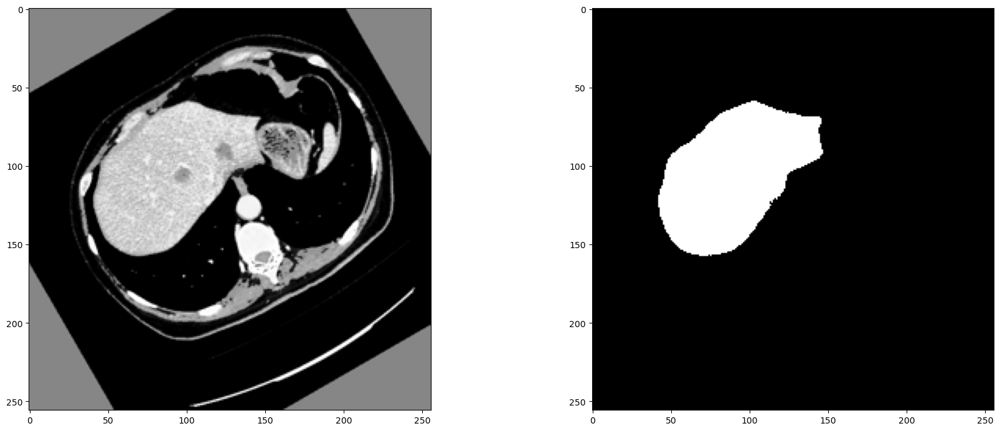

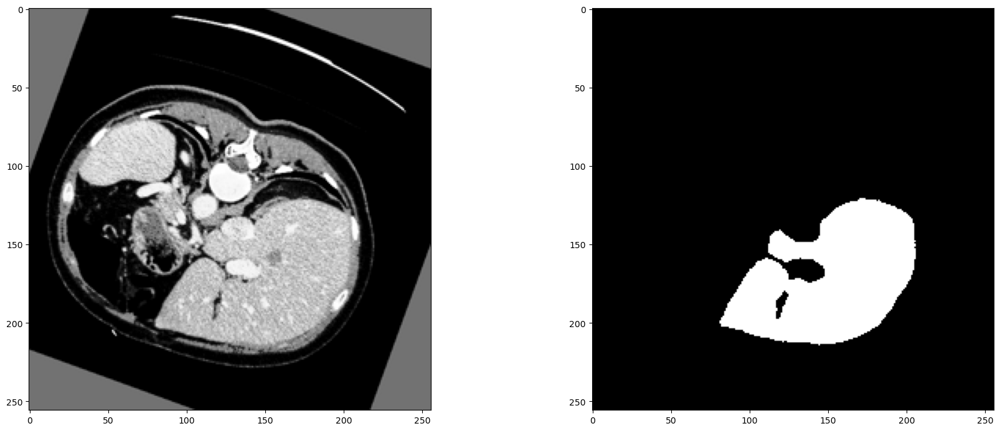

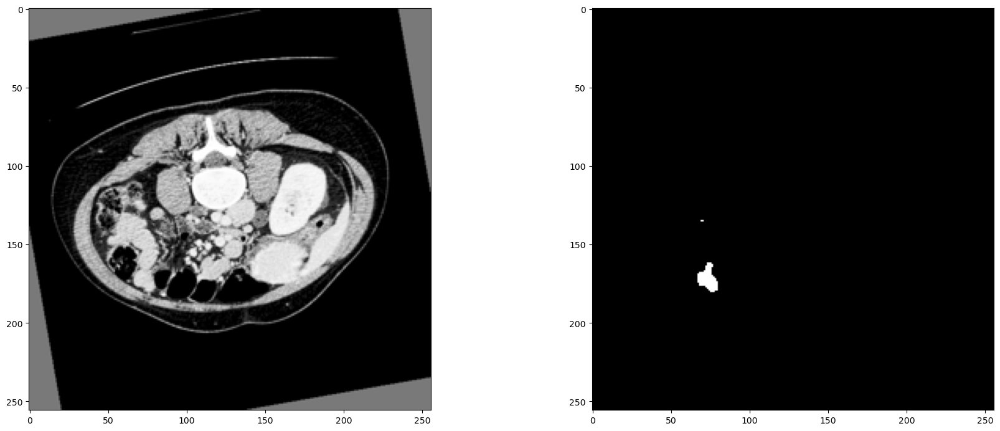

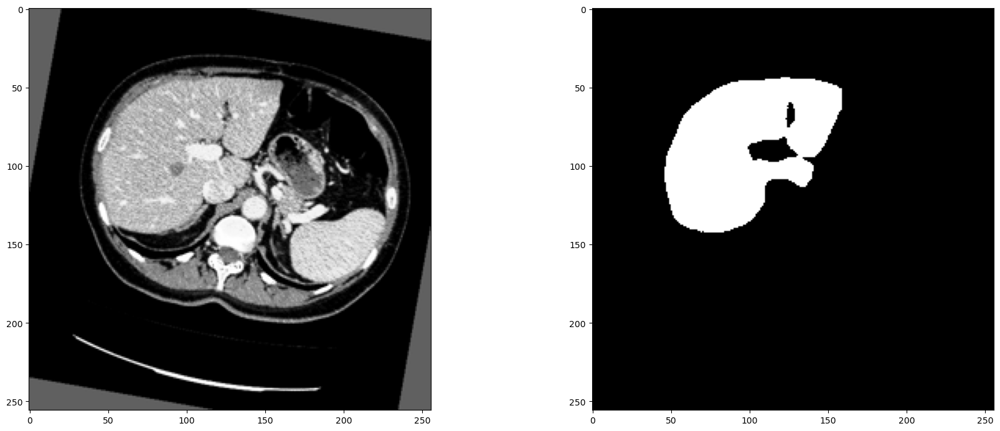

...

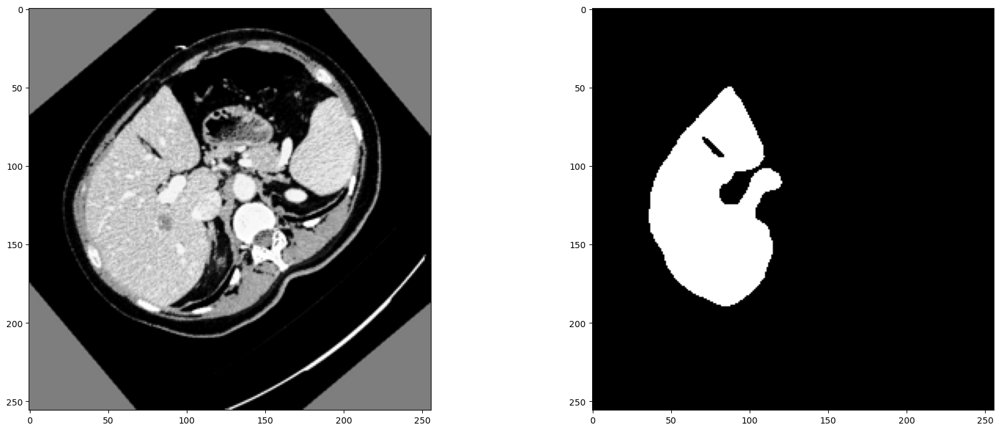

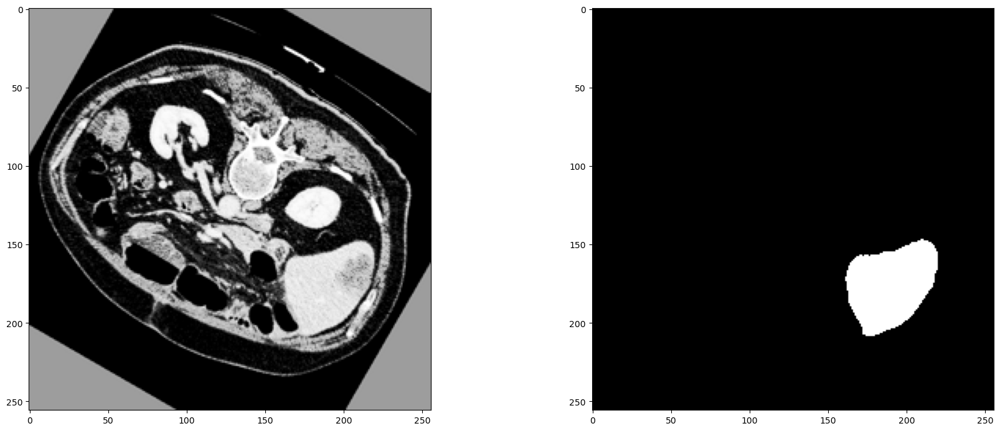

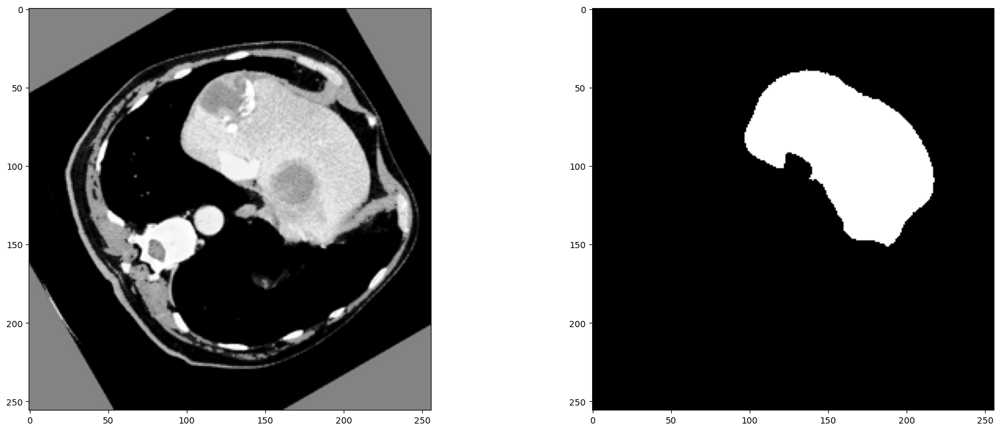

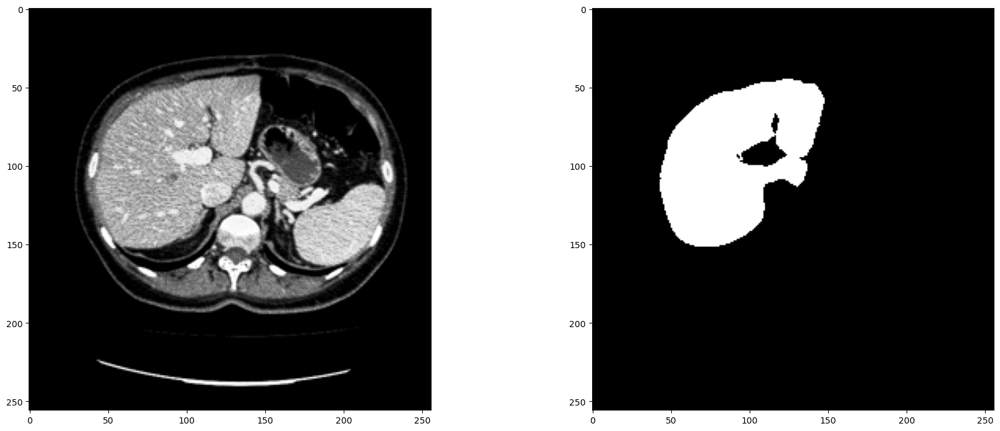

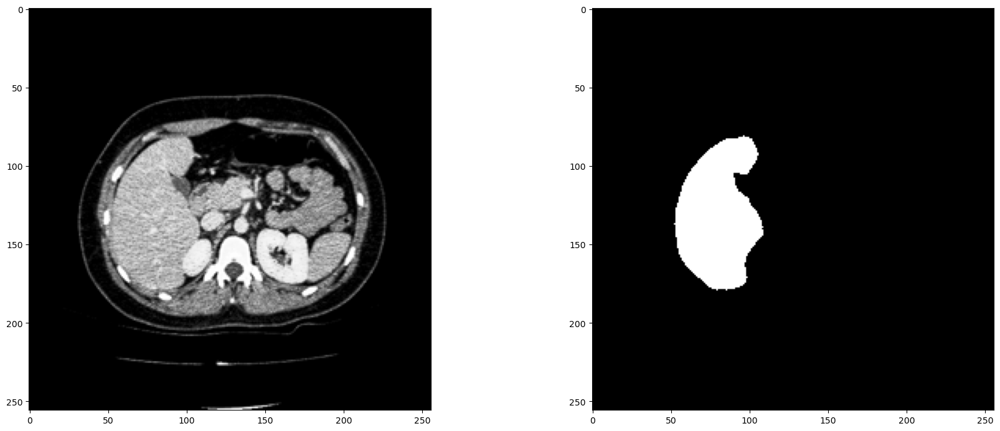

In [224]:
for i in range(1, 5, 1):
    ## Dataset for prediction
    x, y = valid_gen.__getitem__(i)
    result = model.predict(x)
    result = result > 0.5
    
    for i in range(len(result)):
        fig = plt.figure(figsize=(20,20))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)

        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(np.reshape(y[i]*255, (image_size, image_size)), cmap="gray")
        ax.imshow(x[i])
        ax = fig.add_subplot(1, 2, 2)
        ax.imshow(np.reshape(result[i]*255, (image_size, image_size)), cmap="gray")

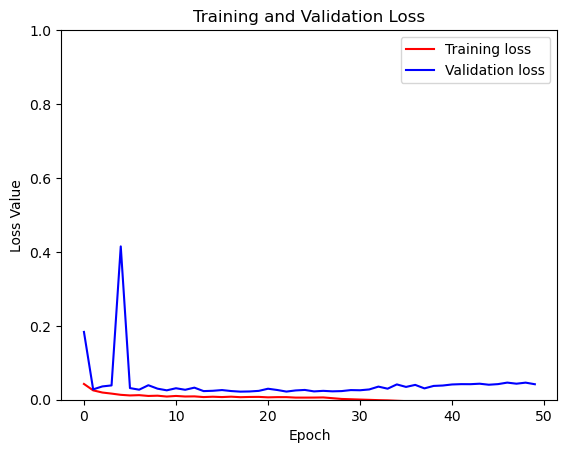

In [226]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

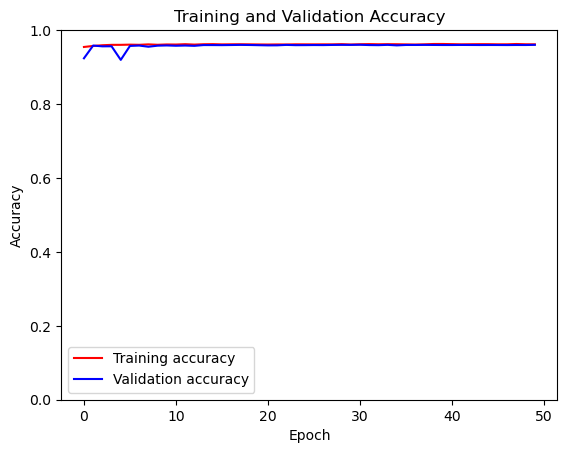

In [225]:
# Access training and validation accuracy values from the 'history' attribute
accuracy = model_history.history['acc']
val_accuracy = model_history.history['val_acc']

plt.figure()
plt.plot(range(len(accuracy)), accuracy, 'r', label='Training accuracy')
plt.plot(range(len(val_accuracy)), val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend()
plt.show()